In [1]:
from IPython.display import HTML
display(HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<p style="color:#420142;text-align:center;font-size:300%;font-weight:900">ONLINE SHOPPERS INTENTION</p>
<div align="right"><a href="javascript:code_toggle()">Show/Hide the code</a></div>'''))

In [109]:
# importing libraries

# basic
import pandas as pd
import numpy as np
import scipy as sp
import math

# plot
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py
import plotly.figure_factory as ff
from plotly import graph_objs as go, offline as po, tools
import plotly.express as px
from plotly.subplots import make_subplots


# preprocessing
from sklearn.impute import SimpleImputer
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder, LabelBinarizer, StandardScaler
from sklearn.pipeline import Pipeline


# classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import export_graphviz


# score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import confusion_matrix

# IPython
from IPython.display import display
from IPython.display import Markdown as md
import warnings
warnings.filterwarnings('ignore')


SEED= 123456



# EXPORT 4 KIBANA MODIFING THE MONTH as datetime
# data download
dataset= 'http://archive.ics.uci.edu/ml/machine-learning-databases/00468/online_shoppers_intention.csv'
# reading csv into df
dfkib= pd.read_csv(dataset)
dfkib['Month']= dfkib['Month'].str.replace('June', 'Jun') # removing e to use pd.datetime
dfkib['Month']= dfkib['Month'] +'-17'
dfkib['Month']= pd.to_datetime(dfkib['Month'], format='%b-%y')#.dt.month # mapping is faster
dfkib.to_csv('online_shoppers_intention.csv')
del dfkib




# data download
dataset= 'http://archive.ics.uci.edu/ml/machine-learning-databases/00468/online_shoppers_intention.csv'
# reading csv into df
df= pd.read_csv(dataset)

## Index
1. [Introduction](#Introduction)
2. [Data](#Data)  
    2.1. [Data Collection](#Data_Collection)  
    2.2. [Exploratory Data Analysis](#Exploratory_Data_Analysis)  
3. [Modelling](#Modelling)  
    3.1. [Classifiers](#Classifiers)  
    3.2. [Random Forest Classifier](#Random_Forest_Classifier)  
    3.3. [Support Vector Machine](#Support_Vector_Machine)  
    3.4. [Predictions](#Predictions)
4. [Conclusion](#Conclusion)
    

# 1. Introduction
[[ go back to the top ]](#Index)
 <a class="anchor" id="Introduction"></a>

In today’s world, online shopping importance is growing expontnialy, more than 1.7 billion people are connected to the Internet and these connections are growing by staggering rate. It is logical to expect a considerable increase in online shopping. Online shopping is a process through which goods and services are exchanged between customers and sellers via Internet: customers can place order for products via Internet from anywhere as the access is available.

Online has grown steadily as a percentage of retail sales since 2000.
[Mary Meeker’s 2019 Internet Trends report](https://www.bondcap.com/report/itr19/#view/title) looked back over the growth of ecommerce as a percentage of total retail sales in the US, from Q1 2000 to Q1 of 2019, therefore predicting commercial intent of online consumers is becoming an important opportunity ine-commerce business that needs to be addressed.


Consumers shop essentially for two motives, to meet experiential (fun) or goal-oriented
(efficiency) needs (Wolfinbarger & Gilly, 2001). The information provided by content
marketing seeks to focus on consumers need for information and entertainment, instead of
focusing on the brand. Thus, it is expected that the type of content format will have different
effects on the attitudes and purchase intention on the online shopper, depending on the online
shopping purpose.

As the vast majority of people visiting a given e-commerce site is much more likely to [leave without buying](https://www.smartinsights.com/ecommerce/ecommerce-analytics/ecommerce-conversion-rates/) anything than viceversa, understanding what motivates consumer intention is the key to survival in this fast-paced and hypercompetitive environment. The end goal is identifiy what drives the consumer's intention, and accurately predicts the usage behaviour of consumers.
Given the ability to dentify customer behavior in advance, marketers can develop strategies that are more likely to result in conversions, making content marketing improvements by looking at customer engagement and interaction metrics.  

The goal is to create a model that help optimizing marketing efforts predicting the consumers intention given their interaction with the web contents.

# 2. Data
 <a class="anchor" id="Data"></a>

## 2.1. Data Collection
[[ go back to the top ]](#Index)
 <a class="anchor" id="Data_Collection"></a>

### Data Set Information:

The dataset consists of feature vectors belonging to 12,330 sessions.   
The dataset was formed so that each session 
would belong to a different user in a 1-year period to avoid 
any tendency to a specific campaign, special day, user 
profile, or period.

The dataset first 5 rows, as example of the data:

In [5]:
# using IPython to display the df (no out)
display(df.head())

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [6]:
# trasforming all continuous variable from int to float
# easier to select, not the best solution (more memory and computation)
for cat in ['Administrative', 'Informational', 'ProductRelated']:
    df[cat]= df[cat].astype(float)

# month as str to mont as number
df['Month']= df['Month'].str.replace('June', 'Jun') # removing e to use pd.datetime
df['Month']= pd.to_datetime(df['Month'], format='%b')#.dt.month # mapping is faster
df['Month']= df['Month'].dt.month # extracting month num from datetime

### Attribute Information:

The dataset consists of 10 numerical and 8 categorical attributes.
- The 'Revenue' attribute can be used as the class label.
- "Administrative", "Administrative Duration", "Informational", "Informational Duration", "Product Related" and "Product Related Duration" represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories. The values of these features are derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another. 
- The "Bounce Rate", "Exit Rate" and "Page Value" features represent the metrics measured by "Google Analytics" for each page in the e-commerce site. The value of "Bounce Rate" feature for a web page refers to the percentage of visitors who enter the site from that page and then leave ("bounce") without triggering any other requests to the analytics server during that session. 
- The value of "Exit Rate" feature for a specific web page is calculated as for all pageviews to the page, the percentage that were the last in the session. 
- The "Page Value" feature represents the average value for a web page that a user visited before completing an e-commerce transaction. 
- The "Special Day" feature indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. For example, for Valentina’s day, this value takes a nonzero value between February 2 and February 12, zero before and after this date unless it is close to another special day, and its maximum value of 1 on February 8. 
- The dataset also includes operating system, browser, region, traffic type, visitor type as returning or new visitor, a Boolean value indicating whether the date of the visit is weekend, and month of the year.

## 2.2. Exploratory Data Analysis
 <a class="anchor" id="Exploratory_Data_Analysis"></a>

Let's check how 'Revenue' attribute is devided:

In [7]:
# create a pie chart 'Revenue'
fig = go.Figure(data=[go.Pie(labels=['False', 'True'], 
                             values=[df['Revenue'].value_counts()[False],
                                    df['Revenue'].value_counts()[True]])])
# pie chart layout
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(line=dict(color='#000000', width=2)))
layout = go.Layout(
    title='Session Revenue', #Title
    titlefont= {"size": 24})
fig.update_layout(layout)

fig.show()

In [8]:
rev_perc= round(df['Revenue'].sum() / df.shape[0] * 100 ,2)
display(md(f'''The {rev_perc}% of the sessions end with positive Revenue(True), 
online shopping trips don’t always lead to a purchase.'''))

The 15.47% of the sessions end with positive Revenue(True), 
online shopping trips don’t always lead to a purchase.

 This unbalance must be taken into account: most machine learning algorithms work best when the number of samples in each class are about equal. This is because most algorithms are designed to maximize accuracy and reduce error.

### Categorical Attributes

A categorical attribute (sometimes called a nominal attribute) is one that has two or more categories, but there is no intrinsic ordering to the categories.  
For example, gender is a categorical attribute having two categories (male and female) and there is no intrinsic ordering to the categories. Hair color is also a categorical attribute having a number of categories (blonde, brown, brunette, red, etc.) and again, there is no agreed way to order these from highest to lowest.  
A purely categorical attribute is one that simply allows you to assign categories but you cannot clearly order the attributes. If the attribute has a clear ordering, then that attribute would be an ordinal attribute, as described below.  
A categorical attribute that can take on exactly two values is termed a binary attribute or a dichotomous attribute; an important special case is the Bernoulli attribute. Categorical attributes with more than two possible values are called polytomous attribute.

In [9]:
# list of categorical
attributes= ['Browser', 'OperatingSystems', 'Region', 'TrafficType', 'VisitorType', 'Month', 'Weekend']

In [10]:
att_descr= []
for att in attributes[:-1]:
    val_count= df[att].value_counts(normalize= True, ascending= False)
    val_perc= (val_count.values * 100).round(2)
    string= f'''{att}  {str(val_count.index[0])} represents the {str(val_perc[0])}% of the total, 
    follwed by {att} {str(val_count.index[1])} accounting for the {str(val_perc[1])}%. 
    {att} {str(val_count.index[-1])} is the {att} with less sessions ({str(val_perc[-1])}%)'''
    att_descr.append(string)
display(md('. '.join(att_descr)))
del att_descr

Browser  2 represents the 64.57% of the total, 
    follwed by Browser 1 accounting for the 19.97%. 
    Browser 9 is the Browser with less sessions (0.01%). OperatingSystems  2 represents the 53.54% of the total, 
    follwed by OperatingSystems 1 accounting for the 20.97%. 
    OperatingSystems 5 is the OperatingSystems with less sessions (0.05%). Region  1 represents the 38.77% of the total, 
    follwed by Region 3 accounting for the 19.49%. 
    Region 5 is the Region with less sessions (2.58%). TrafficType  2 represents the 31.74% of the total, 
    follwed by TrafficType 1 accounting for the 19.88%. 
    TrafficType 17 is the TrafficType with less sessions (0.01%). VisitorType  Returning_Visitor represents the 85.57% of the total, 
    follwed by VisitorType New_Visitor accounting for the 13.74%. 
    VisitorType Other is the VisitorType with less sessions (0.69%). Month  5 represents the 27.28% of the total, 
    follwed by Month 11 accounting for the 24.31%. 
    Month 2 is the Month with less sessions (1.49%)

In [12]:
# initiate subplots table + bar
fig = make_subplots(
    rows=1, cols=2,
    shared_xaxes=True,
    vertical_spacing=0.03,
    specs=[[{"type": "table"}, {"type": "bar"}]])

# create first shown bar plot (with Browser)
# count true and false revenue divided by browser
valcount_true= df[df['Revenue']]['Browser'].value_counts()
valcount_false= df[~df['Revenue']]['Browser'].value_counts()

# create first table 
# group by revenue and browser, count each occurence
groupby_rev= df.groupby(['Browser', 'Revenue']).size().groupby(level=0)
# calculating percentage fase true revenue
groupby_rev= groupby_rev.apply(lambda x:  round(100 * x / float(x.sum()),2)).unstack()
# joining the value count
groupby_rev= groupby_rev.join(df['Browser'].value_counts())
# removing first column (False keeping only True)
groupby_rev= groupby_rev.iloc[:,1:]
# renaming columns
groupby_rev.columns= ['Revenue %', 'Count']
# resetting index back
groupby_rev.reset_index(inplace= True)

# Creating 2 bar figures to be stacked
bart= go.Bar(name='True', x=valcount_true.index, y=valcount_true.values)
barf= go.Bar(name='False', x=valcount_false.index, y=valcount_false.values)

# create table from group by of the first table
table= go.Table(header=dict(values=groupby_rev.columns),
                cells=dict(values= groupby_rev.astype(str).values.transpose()))

# create a button with cagegorical variables
buttons= []
for att in attributes:
    # redo table calculation for each categorical
    groupby_rev= df.groupby([att, 'Revenue']).size().groupby(level=0)
    groupby_rev= groupby_rev.apply(lambda x:  round(100 * x / float(x.sum()),2)).unstack()
    groupby_rev= groupby_rev.join(df[att].value_counts())
    groupby_rev= groupby_rev.iloc[:,1:]
    groupby_rev.columns= ['Revenue %', 'Count']
    groupby_rev.reset_index(inplace= True)
    # dict with button attributes
    dict_4butt= {'method': 'restyle', 'label': att, 
                 'args': [
                     {'x': [df[~df['Revenue']][att].value_counts().index, # modify bar (x axis)
                            df[df['Revenue']][att].value_counts().index],
                      'y': [df[~df['Revenue']][att].value_counts().values, # modify bar (y axis)
                            df[df['Revenue']][att].value_counts().values],
                      'header': dict(values= groupby_rev.columns), # modify header of table
                      'cells': dict(values= groupby_rev.values.transpose()), # modify columns of table
                     },
        ] }
    buttons.append(dict_4butt)

# adding the figures trace (table and bar) to the figure
fig.add_trace(barf, row=1, col=2)
fig.add_trace(bart, row=1, col=2)
fig.add_trace(table, row=1, col=1)
# create dropdown from buttons
updatemenus = [{'buttons': buttons,
                'direction': 'down',
                'showactive': True, }]
# update layout with update menu, stacked bar and title
layout = go.Layout(updatemenus=updatemenus,
                   barmode='stack',
                   title='Revenue: Categorical Attributes',
                   titlefont= {"size": 24})
fig.update_layout(layout, barmode='stack')
fig.show()


The standard deviation is an indicator of how widely values in a group differ from the mean, a higher standard deviation between the the groups of the same attribute can help to identify which are the attribute important for the prediciton.  
A weighted standard deviation allows to apply a weight, or relative significance to each value in a set of values. Values with a higher value for their weight are considered as more significant to a sample as compared to the other values in a sample.

In [11]:
# calculating weighted avg and std for each attribute
avg_std= []
for att in attributes:
    # group by revenue and browser, count each occurence
    groupby_rev= df.groupby([att, 'Revenue']).size().groupby(level=0)
    # calculating percentage fase true revenue
    groupby_rev= groupby_rev.apply(lambda x:  round(100 * x / float(x.sum()),2)).unstack()
    # joining browser back
    groupby_rev= groupby_rev.join(df[att].value_counts())
    # removing first column (False keeping only True)
    groupby_rev= groupby_rev.iloc[:,1:]
    # renaming columns
    groupby_rev.columns= ['Revenue %', 'Count']
    # resetting index back
    groupby_rev.reset_index(inplace= True)
    # dropping na value
    groupby_rev.dropna(inplace= True)
    # calculating avg and std
    avg= np.average(groupby_rev['Revenue %'].values, weights= groupby_rev['Count'].values)
    std= math.sqrt(np.average((groupby_rev['Revenue %'].values-avg)**2, weights=groupby_rev['Count'].values))
    # appending attribute average and std to list to create df
    avg_std.append([att, avg, std])

# creating df with weighted avg and std per attribute
avg_std= pd.DataFrame(avg_std, columns=['Attribute', 'Weighted avg', 'Weighted std']).set_index('Attribute')
display(avg_std)

,Weighted avg,Weighted std
Attribute,,
Browser,15.475017,1.709117
OperatingSystems,15.475636,2.821925
Region,15.474193,0.991838
TrafficType,15.538550,6.227630
VisitorType,15.472236,3.788134
Month,15.475288,6.389879
Weekend,15.473835,1.060454


### Continuous Attributes

Continuous attributes are the ones that can be measured, resulting in an infinite number of possible values within a range.  
Using a correlation matrix to check which are the continuos variables most correlated with Revenue, and how them are correlated between themself.  
A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables.

In [13]:
# create a correlation df with continuos and binomial attributes
df_corr= df.select_dtypes(include=['float', 'bool']).corr()

In [14]:
# plot heatmap
fig = go.Figure(data=go.Heatmap(
                   z=df_corr.values,
                   x=df_corr.index,
                   y=df_corr.columns, colorscale = 'BuPu'))
# adding title to heatmap
layout = go.Layout(
    title='Correlation Matrix - Continuos Attributes',
    titlefont= {"size": 24},
    font=dict(size=14))
fig.update_layout(layout)
fig.show()

On the bottom left of the correlation matrix there is evident a moderate-to-strong correlation between the attributes related to the page types. It is logical to experience, in each page type, a strong correlation between the number of pages visited and the total time spent on that particular group.  
ExitRates and BounceRates are strongly correlated. 

In the table below is possible to see how each continuos variable relate to Revenue using the Pearson correlation: is a number between -1 and 1 that indicates the extent to which two variables are linearly related: where 1 is total positive linear correlation, 0 is no linear correlation, and −1 is total negative linear correlation.

In [15]:
# Serie with revenue correlation
corr_revenue= df_corr['Revenue'][:-1]

corr_revenue= pd.DataFrame(corr_revenue)
corr_revenue.columns= ['Pearson Correlation']
display(corr_revenue.sort_values(by='Pearson Correlation', ascending= False))

,Pearson Correlation
PageValues,0.492569
ProductRelated,0.158538
ProductRelated_Duration,0.152373
Administrative,0.138917
Informational,0.095200
Administrative_Duration,0.093587
Informational_Duration,0.070345
Weekend,0.029295
SpecialDay,-0.082305
BounceRates,-0.150673


There is a moderate positive correlation between Revenue and PageValues, the other correlation are weak.
Let's check how the relation between the 3 attributes most correlated with Revenue look like in a 3d plot.    
The month filter helps to visualize the relationship between the 3 attributes and Revenue, decreasing the number of points in the chart. in addidtion gives an overview of the change in volume over time adding a 4th attribute to the chart.

In [16]:
# sorting to order month
df.sort_values(by='Month', inplace= True)
# 3d scatterplot with month animation
fig = px.scatter_3d(df.astype({'Revenue': str}), x='PageValues', y='ExitRates', z='ProductRelated',
                    color='Revenue',animation_frame= 'Month', hover_name='Revenue')

layout = go.Layout(
    title='Most Correlated Continuos Attributes',
    titlefont= {"size": 24},
    font=dict(size=14))
fig.update_layout(layout)
        

fig.show()

# 3. Modelling
[[ go back to the top ]](#Index)
 <a class="anchor" id="Modelling"></a>

## 3.1. Classifiers
 <a class="anchor" id="Classifiers"></a>

To predict the purchasing intention of the visitors the attributes explored above are fed to 4 classifiers:
- Logistic Regression
- Support Vector Classifier
- Random Forest Classifier
- Multi-layer Perceptron  

The first step is to assigns a unique value or number to each label in a categorical attribute: the calssifiers need numeric arrays because string cannot be handled by these learners.

In [17]:
# instantiate Encoder and Binarizer
label_encoder = LabelEncoder()
label_binarizer = LabelBinarizer()

# Encode VisitorType (string)
df['VisitorType'] = label_encoder.fit_transform(df['VisitorType'].values)
# Binarize Boolean variables
df['Weekend'] = label_binarizer.fit_transform(df['Weekend'].values)
df['Revenue'] = label_binarizer.fit_transform(df['Revenue'].values)

Secondly, is important to standardize the attributes as the classifier work better when features are on a relatively similar scale and close to normally distributed.  
Using StandardScaler each value in the dataset will have the sample mean value subtracted, and then divided by the standard deviation of the whole dataset, such that the distribution will have a mean value 0 and standard deviation of 1.

In [82]:
# standardize the attributes
scaler = StandardScaler()

X = scaler.fit_transform(df.iloc[:, :-1])
y = df['Revenue']

To obtain an unbiased estimatation of the model accuracy the dataset is splitted in you 2, train (75% of the entries) and test(25%):

- The training dataset is used to train and tune the model

- The test dataset used to assess how well the trained model performs with unseen data.

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y)

Recall and F1 scores are used to compare the modles.
- Recall can be defined as the ratio of the total number of correctly classified positive examples divide to the total number of positive examples. High Recall indicates the class is correctly recognized 
-  F1-score is s the harmonic mean of Precision(number of correctly classified positive examples by the total number of predicted positive examples) and Recall
$$precision=\frac{TP}{TP+FN}; recall=\frac{TP}{TP+FN}; F1 = \frac{2 \cdot precision\cdot recall}{precision+ recall}$$  

High Recall indicates the Revenue are correctly recognized, and the miss-classification of some of the non-purchase activity as Revenue, it won’t cause any significant damage to the business.
Cross-validation is used to evaluate the different models, the training data is randomly partitioned into k equal size subsamples (10 in this case), of the k subsamples, a single subsample is retained as the validation data for testing the model, and the remaining subsamples are used as training data. The cross-validation process is then repeated k times (the folds), with each of the k subsamples used exactly once as the validation data.
The results of the Cross validation are displayed in a box plot:


In [119]:
# instantiates the models
lr= LogisticRegression(class_weight='balanced', random_state= SEED)
svc= SVC(class_weight='balanced', random_state= SEED)
rfc= RandomForestClassifier(class_weight='balanced', random_state= SEED)
mlpc= MLPClassifier(random_state= SEED)

# loop to score the models with cross validation (10 folds)
scores= {}
models= [('lr', lr), ('svc', svc), ('rfc', rfc), ('mlpc', mlpc)]
cv= 10
for mod in models:
    score= cross_validate(mod[1], X_train, y_train, cv=cv, n_jobs=-1, scoring= ['recall', 'f1'],
                          return_train_score=True, return_estimator=True)
    # entry in dict key: model name, values list(10 accuracy score + 10 f1 score)
    scores[mod[0]]= np.append(score['test_recall'], score['test_f1'])

# create a dataframe from the scores
scores= pd.DataFrame(scores)

In [120]:
 # list with 10 accuracy and 10 f1 string, used to split the chart in 2
x= ['Recall' for i in range(10)] + ['F1' for i in range(10)] 


# create a box chart with accuracy and f1 for the models
fig = go.Figure()

fig.add_trace(go.Box(
    y= scores['lr'],
    x= x,
    name= 'LR',
    marker_color= 'blue'
))
fig.add_trace(go.Box(
    y= scores['svc'],
    x= x,
    name= 'SVC',
    marker_color= 'red'
))
fig.add_trace(go.Box(
    y= scores['rfc'],
    x= x,
    name= 'RFC',
    marker_color= 'green'
))

fig.add_trace(go.Box(
    y= scores['mlpc'],
    x= x,
    name= 'MLPC',
    marker_color= 'orange'
))

fig.update_layout(
    title='Models Performance: Recall and F1', #Title
    titlefont= {"size": 24},
    yaxis_title= 'score',
    boxmode= 'group' # group together boxes of the different traces for each value of x
)
fig.show()

## 3.2. Random Forest Classifier
 <a class="anchor" id="Random_Forest_Classifier"></a>

While Support Vector Machine shows the most consisten results, let's start with Random Forest Classifier for two reasons, the first is Random Forests are often used for feature selection in a data science workflow, the second is that this model is easier to explain and visualize.  
Random Forests is a supervised learning algorithm that uses predictive models,the decision trees, to go from observations about an item to conclusions about the item's target value. It creates decision trees on randomly selected data samples, gets prediction from each tree and selects the best solution by means of voting.  
Decision tree classifiers are incredibly simple in theory. In their simplest form, decision tree classifiers ask a series of Yes/No questions about the data — each time getting closer to finding out the class of each entry — until they either classify the data set perfectly or simply can't differentiate a set of entries.
Random Forest has many advantages:
- It is a highly accurate and robust method because of the number of decision trees participating in the process
- It correcta for decision trees' habit of overfitting to their training set.
- It provides a pretty good indicator of the feature importance (as the decision tree)
- It has online learning implementations (can easely be updated with new examples)

In [94]:
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 25 different combinations, and use all available cores
rfc_rand = RandomizedSearchCV(rfc, param_distributions = random_grid, scoring= 'recall',
                              n_iter = 25, cv = 3, random_state=42, n_jobs = -1)
# Fit the random search model
rfc_best= rfc_rand.fit(X_train, y_train).best_estimator_

The following model, that maximize the Recall, is the result of a randomized search, a technique where random combinations of the hyperparameters are used to find the best solution for the built model.

In [95]:
display(rfc_best.fit(X_train, y_train))

RandomForestClassifier(bootstrap=False, class_weight='balanced',
            criterion='gini', max_depth=10, max_features='sqrt',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=4,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=1200, n_jobs=None, oob_score=False,
            random_state=123456, verbose=0, warm_start=False)

In [115]:
display(md(f'The tuned Random Forest performes very well on the traing data, acheiving a Recall score of: {round(rfc_rand.best_score_,4)}'))

The tuned Random Forest performes very well on the traing data, acheiving a Recall score of: 0.8064

As above mentioned, Random Forests are an example of an ensemble learner built on decision trees.
Decision trees are a intuitive and easy to visualize, binary answering a series of questions designed to zero-in on the classification.
Let's check the first steps of a tree in the forest:

In [97]:
# visualize 3 depth of the classifiers
# Export as dot file
export_graphviz(rfc_best.estimators_[0],
                out_file='tree.dot', 
                max_depth= 3,
                feature_names = df.columns[:-1],
                rounded = True, proportion = False, 
                precision = 2, filled = True)


# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
display(Image(filename = 'tree.png'))

And the full tree:

In [98]:
# visualize 3 depth of the classifiers
# Export as dot file
export_graphviz(rfc_best.estimators_[0],
                out_file='tree_full.dot', 
                feature_names = df.columns[:-1],
                rounded = True, proportion = False, 
                precision = 2, filled = True)


# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree_full.dot', '-o', 'tree_full.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
display(Image(filename = 'tree_full.png'))

The tree-based strategies used by random forests naturally ranks by how well they improve the purity of the node.  
This mean decrease in impurity over all trees (called gini impurity). Nodes with the greatest decrease in impurity happen at the start of the trees, while notes with the least decrease in impurity occur at the end of trees:

In [99]:
importance= pd.DataFrame(data={
    'feature': df.columns[:-1],
    'importance': rfc_best.feature_importances_,
    'std': np.std([tree.feature_importances_ for tree in rfc_best.estimators_],axis=0)  })

importance.sort_values(by='importance', ascending= False, inplace= True)

trace = go.Bar(x=importance['feature'],
               y=importance['importance'],
               marker=dict(color='green'),
               error_y= dict(visible=True, arrayminus=importance['std'], color= 'black'),
               opacity=0.5
              )

layout = go.Layout(title="Random Forest: Attribute importance")
fig = go.Figure(data=[trace], layout=layout)

fig.show()

## 3.3. Support Vector Machine
 <a class="anchor" id="Support_Vector_Machine"></a>

Support vector machines is a supervised learning model especially effective at classification, that considering each attribute as a point in n-dimensional space (where n is number of attributes you have) with the value of each attribute being the value of a particular coordinate, classifies the target classes by finding the hyper-plane that separetes the points.

In [106]:
random_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.01, 0.1, 1, 10, 100],
    'degree': range(1,6)}
 
# Make grid search classifier
svc_rand = RandomizedSearchCV(svc, param_distributions = random_grid, scoring= 'recall',
                              n_iter = 25, cv = 3, random_state=42, n_jobs = -1)
# Fit the random search model
svc_best= svc_rand.fit(X_train, y_train).best_estimator_

In [137]:
display(md(f'The following tuned SVC has a Recall score of {round(svc_rand.best_score_,4)} on the training data'))

The following tuned SVC has a Recall score of 0.7652 on the training data

In [112]:
display(svc_best.fit(X_train, y_train))

SVC(C=0.1, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=5, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=123456,
  shrinking=True, tol=0.001, verbose=False)

## 3.4. Predictions
 <a class="anchor" id="Predictions"></a>

In [123]:
rfc_pred= rfc_best.predict(X_test)
svc_pred= svc_best.predict(X_test)

The tuned Random Forest outpermformed the Support Vector Machine on the test dataset:

In [141]:
display(md(f'''
- Random Forest - Recall: {round(recall_score(y_test, rfc_pred),4)}, F1: {round(f1_score(y_test, rfc_pred),4)}
- SVC - Recall: {round(recall_score(y_test, svc_pred),4)}, F1: {round(f1_score(y_test, svc_pred),4)}'''))


- Random Forest - Recall: 0.7987, F1: 0.6638
- SVC - Recall: 0.7442, F1: 0.5912

Let's use a confusion matrix to visualize a summary of Random Forest predctions, in the matrix the number of correct and incorrect predictions are summarized with count values and broken down by each class, giving insight not only into the errors being made by a classifier but more importantly the types of errors that are being made, as a reminder the Recall score that we want to maximize is:
$$recall=\frac{TruePositive}{TruePositive+FalseNegative}$$

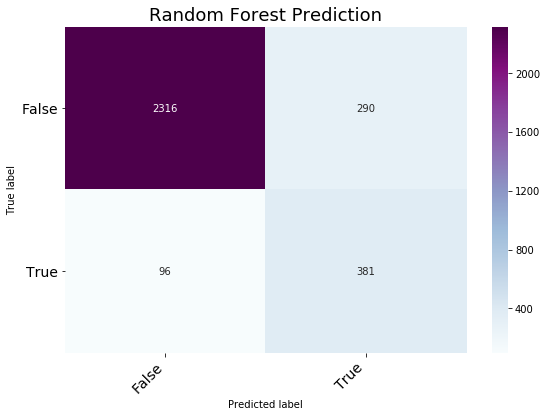

In [132]:
df_cm = pd.DataFrame(
    confusion_matrix(y_test, y_pred), index=['False', 'True'], columns=['False', 'True'])
fig = plt.figure(figsize= (9,6))

heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cmap= 'BuPu')

heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=14)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Random Forest Prediction', fontsize=18)
display(fig)
plt.close()

# 4. Conclusion
[[ go back to the top ]](#Index)
 <a class="anchor" id="Conclusion"></a>

Thi study shows how to is possible to predict the purchasing intention of the visitor using aggregated pageview data kept track during the visit along with some session and user information. These attributes are fed to random forest classifiers as input, that results in a higher Recall compered to the oter model tested (SVC).  
In conlusion, a Random Forest classifier can be implemented to predict the  purchasing intention prediction for virtual shopping environment using clickstream and session information data.